# Analiza parametrów DBSCAN — endpointy przejazdów S8 (Yanosik, Warszawa)

**Zadanie:** rozważyć parametry DBSCAN (`eps` **oraz** `min_samples`), dobrać je metodą łokcia + kryteriami jakości, porównać z parametrami dotychczasowymi (`eps=150 m`, `min_samples=8`), policzyć **% szumu** i zastosować podział **train/test**.

## 0. Słowniczek

**DBSCAN** 
- **`eps`** — promień sąsiedztwa (tu w metrach),
- **`min_samples`** — ile punktów musi być w promieniu `eps`, by obszar był „gęsty".

Punkty: **core** (≥ `min_samples` sąsiadów), **border** (w sąsiedztwie rdzenia), **noise/szum** (etykieta **`-1`** — punkty odrzucone; ich procent pilnujemy).

**haversine** — odległość po powierzchni kuli (lat/lon). Euklides na stopniach jest błędny (1° długości ≈ 68 km, 1° szerokości ≈ 111 km), więc współrzędne idą do DBSCAN w **radianach** z `metric="haversine"`, a `eps` w metrach dzielimy przez promień Ziemi.

**silhouette** — jakość klastrowania od −1 do 1 (jak dobrze punkt pasuje do swojego klastra vs najbliższego obcego). Liczona bez szumu.

**elbow / k-distance** — dobór `eps`: odległość każdego punktu do **k-tego** sąsiada (`k = min_samples`), sortujemy, „kolano" krzywej = granica gęsto/rzadko. 

## 1. Dane i odtworzenie endpointów

DBSCAN działa na **endpointach**: pierwszym i ostatnim punkcie każdego *użytecznego* przejazdu (przeszedł filtry jakości i jest `car_like`). Poniżej odtwarzam ten sam łańcuch przekształceń co główny pipeline (te same `PARAMS`).

In [1]:
import numpy as np
import pandas as pd

DATA_FILE = "data/2024_11_17_17_00_processed.csv"

EARTH_R = 6_371_000  # promień Ziemi [m]
PARAMS = {
    "time_gap_new_trip_s": 5*60, "max_plausible_speed_kmh": 180,
    "min_trip_points": 4, "min_trip_duration_s": 30, "min_trip_distance_m": 200,
    "stop_speed_kmh": 3, "long_stop_s": 3*60,
    "bike_max_reported_speed_kmh": 35, "bike_max_gps_speed_kmh": 45, "bike_median_speed_kmh": 25,
    "car_min_p90_speed_kmh": 45, "car_min_max_speed_kmh": 60,
}

def haversine_m(lat1, lon1, lat2, lon2):
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat, dlon = lat2-lat1, lon2-lon1
    a = np.sin(dlat/2)**2 + np.cos(lat1)*np.cos(lat2)*np.sin(dlon/2)**2
    return 2*EARTH_R*np.arcsin(np.sqrt(a))

In [2]:
def build_endpoints(csv_path):
    """Odtwarza endpointy dokładnie jak trip_extraction_od_matrix.ipynb (sekcje 4-8)."""
    df = pd.read_csv(csv_path, parse_dates=["timestamp","time"]).sort_values(["vehicle_id","timestamp"]).copy()
    g = df.groupby("vehicle_id")
    df["time_diff_s"] = (df["timestamp"]-g["timestamp"].shift(1)).dt.total_seconds()
    df["distance_m"]  = haversine_m(g["lat"].shift(1), g["lon"].shift(1), df["lat"], df["lon"])
    df.loc[df["time_diff_s"].isna(), "distance_m"] = np.nan
    df["gps_speed_kmh"] = (df["distance_m"]/df["time_diff_s"])*3.6
    df["is_stationary_point"] = df["speed"].le(PARAMS["stop_speed_kmh"])
    df["is_implausible_jump"] = df["gps_speed_kmh"].gt(PARAMS["max_plausible_speed_kmh"])

    # długie postoje -> granice przejazdów
    df["stationary_block"] = g["is_stationary_point"].transform(lambda s: s.ne(s.shift()).cumsum())
    sb = (df[df["is_stationary_point"]].groupby(["vehicle_id","stationary_block"])
          .agg(a=("timestamp","min"), b=("timestamp","max")).reset_index())
    sb["dur"] = (sb["b"]-sb["a"]).dt.total_seconds()
    long_keys = set(map(tuple, sb[sb["dur"]>=PARAMS["long_stop_s"]][["vehicle_id","stationary_block"]].values))
    df["is_long_stop_block"] = [k in long_keys for k in zip(df["vehicle_id"], df["stationary_block"])]
    df["prev_long"] = df.groupby("vehicle_id")["is_long_stop_block"].shift(1, fill_value=False)

    # podział na przejazdy
    df["reason"] = "continue"
    df.loc[df["time_diff_s"].isna(), "reason"] = "first_point"
    df.loc[df["time_diff_s"].gt(PARAMS["time_gap_new_trip_s"]), "reason"] = "time_gap"
    df.loc[df["is_implausible_jump"], "reason"] = "gps_jump"
    df.loc[df["prev_long"] & ~df["is_long_stop_block"], "reason"] = "after_long_stop"
    df["new_trip"] = df["reason"].ne("continue")
    df["trip_seq"] = df.groupby("vehicle_id")["new_trip"].cumsum()
    df["trip_uid"] = df["vehicle_id"].astype(str) + "_" + df["trip_seq"].astype(str)

    # statystyki przejazdu + filtry jakości
    ts = (df.groupby("trip_uid").agg(
        points=("timestamp","size"), start_time=("timestamp","min"), end_time=("timestamp","max"),
        start_lat=("lat","first"), start_lon=("lon","first"), end_lat=("lat","last"), end_lon=("lon","last"),
        gps_speed_max=("gps_speed_kmh","max"), distance_m=("distance_m","sum"), implausible=("is_implausible_jump","sum"),
        rep_med=("speed","median"), rep_p90=("speed", lambda s: s.quantile(0.9)), rep_max=("speed","max")).reset_index())
    ts["duration_s"] = (ts["end_time"]-ts["start_time"]).dt.total_seconds()
    ts["valid_basic"] = ~(ts["points"].lt(PARAMS["min_trip_points"])
        | ts["duration_s"].lt(PARAMS["min_trip_duration_s"])
        | ts["distance_m"].lt(PARAMS["min_trip_distance_m"]) | ts["implausible"].gt(0))
    # klasyfikacja trybu (samochód vs wolny ślad)
    bike = (ts["rep_max"].le(PARAMS["bike_max_reported_speed_kmh"]) & ts["gps_speed_max"].le(PARAMS["bike_max_gps_speed_kmh"])
            & ts["rep_med"].le(PARAMS["bike_median_speed_kmh"]))
    car = (ts["rep_p90"].ge(PARAMS["car_min_p90_speed_kmh"]) | ts["rep_max"].ge(PARAMS["car_min_max_speed_kmh"]))
    ts["mode_class"] = np.select([bike, car], ["bike_or_slow","car_like"], default="uncertain")
    ts["usable"] = ts["valid_basic"] & ts["mode_class"].eq("car_like")

    u = ts[ts["usable"]]
    s = u[["trip_uid","start_lat","start_lon"]].rename(columns={"start_lat":"lat","start_lon":"lon"}); s["endpoint_type"]="origin"
    e = u[["trip_uid","end_lat","end_lon"]].rename(columns={"end_lat":"lat","end_lon":"lon"}); e["endpoint_type"]="destination"
    return pd.concat([s, e], ignore_index=True)

endpoints = build_endpoints(DATA_FILE)
print("Endpointy (wejście DBSCAN):", len(endpoints), "|", endpoints["endpoint_type"].value_counts().to_dict())
endpoints.head()

Endpointy (wejście DBSCAN): 4408 | {'origin': 2204, 'destination': 2204}


,trip_uid,lat,lon,endpoint_type
0,0015a2961cb11f7e79a52504b3597b99bb1d01d6a03bbb...,52.25468,20.95298,origin
1,0077e7ad7bffe46df388f4ac582d8e875f937d5b486bc3...,52.26997,20.99809,origin
2,00ac440e057201225e7db09525027138759d952e787277...,52.30655,21.06170,origin
3,00ac440e057201225e7db09525027138759d952e787277...,52.30512,21.05664,origin
4,00c5c59bede3256a7a16512887c7e9f8ae0cf83cbbf6c6...,52.29961,21.03551,origin


## 2. Dotychczasowe parametry

dotychczas: `eps=150 m`, `min_samples=8`, `metric="haversine"` — **wpisane na sztywno** (`PARAMS`), bez metody doboru (autorzy sami zaznaczają, że to wartości startowe). Buduję jedną funkcję `run_dbscan` i liczę baseline.

In [3]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors, BallTree
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
plt.rcParams.update({"figure.dpi":110,"font.size":11,"axes.grid":True,"grid.alpha":0.3})

X = np.radians(endpoints[["lat","lon"]].to_numpy())  # radiany dla metryki haversine

def run_dbscan(eps_m, min_samples, Xi=X):
    """eps w METRACH; zwraca etykiety + (liczba klastrów, % szumu jako ułamek, silhouette)."""
    lab = DBSCAN(eps=eps_m/EARTH_R, min_samples=min_samples, metric="haversine").fit_predict(Xi)
    nc = len(set(lab)) - (1 if -1 in lab else 0)
    noise = (lab==-1).mean()
    sil = np.nan; m = lab!=-1
    if nc>=2 and m.sum()>nc: sil = silhouette_score(Xi[m], lab[m], metric="haversine")
    return lab, nc, noise, sil

_, nc0, noise0, sil0 = run_dbscan(150, 8)
print(f"eps=150 m, min_samples=8  ->  klastry={nc0}, szum={noise0*100:.1f}%, silhouette={sil0:.3f}")

eps=150 m, min_samples=8  ->  klastry=48, szum=2.9%, silhouette=0.747


## 3. `eps` i `min_samples` są sprzężone — rodzina elbow

Metoda łokcia (k-distance) liczy się dla `k = min_samples`. Więc **każdy `min_samples` ma swój własny elbow `eps`** — nie da się dobrać jednego parametru w oderwaniu od drugiego. Liczę elbow `eps` dla kilku `min_samples` i od razu metryki.

In [4]:
def k_distance(k):
    nn = NearestNeighbors(n_neighbors=k+1, metric="haversine").fit(X)
    d, _ = nn.kneighbors(X)
    return np.sort(d[:, k]) * EARTH_R          # k-ty sąsiad [m], posortowane
def knee(y):
    x=np.arange(len(y),dtype=float); xn=(x-x.min())/(x.max()-x.min()); yn=(y-y.min())/(y.max()-y.min())
    i=int(np.argmax(np.abs(yn-xn))); return i, float(y[i])   # punkt najdalej od przekątnej

ms_list=[3,4,5,6,8,10,12,15,20]; fam=[]
for ms in ms_list:
    _, eps_e = knee(k_distance(ms))
    _, nc, noise, sil = run_dbscan(eps_e, ms)
    fam.append({"min_samples":ms,"eps_elbow_m":round(eps_e,1),"n_clusters":nc,
                "noise_%":round(noise*100,1),"silhouette":round(sil,3) if sil==sil else np.nan})
fam = pd.DataFrame(fam); fam

,min_samples,eps_elbow_m,n_clusters,noise_%,silhouette
0,3,34.5,147,9.8,0.611
1,4,39.5,104,12.2,0.655
2,5,38.3,69,16.3,0.670
3,6,47.2,63,15.9,0.689
4,8,47.2,48,19.7,0.704
5,10,51.7,35,21.6,0.811
6,12,63.4,33,21.3,0.814
7,15,71.2,32,21.4,0.813
8,20,78.3,23,25.0,0.868


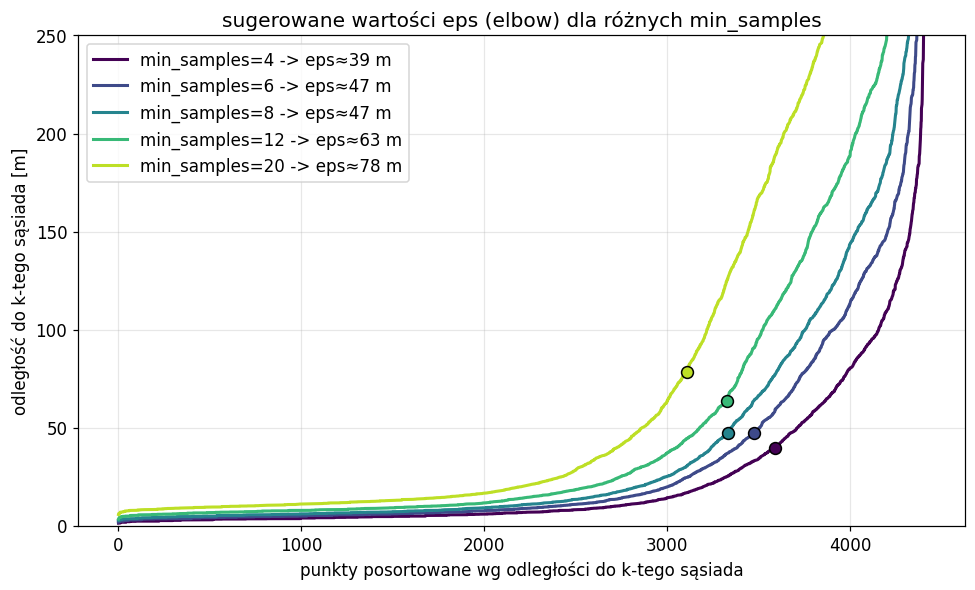

In [5]:
fig,ax=plt.subplots(figsize=(9,5.5))
ks=[4,6,8,12,20]; colors=plt.cm.viridis(np.linspace(0,0.9,len(ks)))
for k,c in zip(ks,colors):
    kd=k_distance(k); i,_=knee(kd)
    ax.plot(kd,color=c,lw=2,label=f"min_samples={k} -> eps≈{kd[i]:.0f} m")
    ax.scatter([i],[kd[i]],color=c,edgecolor="k",zorder=5,s=60)
ax.set_ylim(0,250); ax.set_xlabel("punkty posortowane wg odległości do k-tego sąsiada")
ax.set_ylabel("odległość do k-tego sąsiada [m]")
plot_title = "sugerowane wartości eps (elbow) dla różnych min_samples"
ax.set_title(plot_title)
ax.legend(); fig.tight_layout(); plt.show()

**Obserwacja:** im większy `min_samples`, tym większy elbow `eps`, tym mniej klastrów i **więcej szumu** (~10% przy `ms=3` → ~25% przy `ms=20`). Sam „czysty elbow" przy dowolnym `min_samples` wpada w wysoki szum — potrzebne dodatkowe kryterium.

## 4. Pełna siatka `eps × min_samples` + pułapka silhouette

In [6]:
eps_grid=list(range(10,221,10)); ms_grid=[3,4,5,6,8,10,12,15,20]
rows=[]
for ms in ms_grid:
    for eps in eps_grid:
        _, nc, noise, sil = run_dbscan(eps, ms)
        rows.append({"eps_m":eps,"min_samples":ms,"n_clusters":nc,"noise":noise,"silhouette":sil})
grid=pd.DataFrame(rows)

best_sil = grid[grid.silhouette.notna()].sort_values("silhouette",ascending=False).iloc[0]
print(f"MAX silhouette (bez ograniczeń): eps={best_sil.eps_m:.0f}, ms={int(best_sil.min_samples)} | "
      f"klastry={int(best_sil.n_clusters)}, szum={best_sil.noise*100:.1f}%, sil={best_sil.silhouette:.3f}")

MAX silhouette (bez ograniczeń): eps=40, ms=20 | klastry=16, szum=33.1%, sil=0.890


**Pułapka silhouette:** nieograniczone maksimum wypada przy dużym `min_samples` i daje **bardzo mało klastrów** (~16 zamiast ~48) przy **~33% szumu** — skleja terminale i wyrzuca 1/3 przejazdów. Dlatego dokładam dwa warunki sensowne dla macierzy OD:
- **szum ≤ 10%** (nie wyrzucamy zbyt wielu przejazdów),
- **liczba klastrów 40–60** (zachowujemy granularność, nie zlewamy węzłów).

In [7]:
feas = grid[(grid.noise<=0.10) & grid.n_clusters.between(30,70) & grid.silhouette.notna()].copy()
feas = feas.sort_values("silhouette", ascending=False)
feas["noise_%"]=(feas.noise*100).round(1); feas["silhouette"]=feas.silhouette.round(3)
print("Kandydaci spełniający OBA warunki (top wg silhouette):")
feas.head(10)[["eps_m","min_samples","n_clusters","noise_%","silhouette"]]

Kandydaci spełniający OBA warunki (top wg silhouette):


,eps_m,min_samples,n_clusters,noise_%,silhouette
196,210,20,32,8.8,0.831
170,170,15,38,8.1,0.826
197,220,20,33,7.7,0.826
121,120,10,50,8.4,0.823
195,200,20,33,9.3,0.822
145,140,12,43,8.8,0.822
146,150,12,46,6.7,0.817
123,140,10,47,6.4,0.816
172,190,15,38,5.6,0.813
122,130,10,48,7.3,0.813


MAX silhouette bez ograniczeń:
eps=40, min_samples=20, klastry=16, szum=33.1%, silhouette=0.890

Najlepszy kandydat spełniający warunki:
eps=210, min_samples=20, klastry=32, szum=8.8%, silhouette=0.831

Rekomendowane warianty zależnie od tolerancji na szum:


,wariant,eps_m,min_samples,n_clusters,noise_%,silhouette
0,LOW noise,140.0,10.0,47.0,6.4,0.816
1,MID noise,220.0,20.0,33.0,7.7,0.826
2,HIGH silhouette,210.0,20.0,32.0,8.8,0.831



Elbow dopasowane do najbliższego eps z gridu + metryki DBSCAN:


,min_samples,eps_elbow_raw,eps_grid_used,n_clusters,noise_%,silhouette,spełnia_noise<=10%,spełnia_30_70_klastrów,spełnia_oba
0,3,34.5,30,145,11.7,0.596,False,False,False
1,4,39.5,40,104,12.0,0.654,False,False,False
2,5,38.3,40,76,15.4,0.666,False,False,False
3,6,47.2,50,66,15.0,0.687,False,True,False
4,8,47.2,50,48,18.9,0.732,False,True,False
5,10,51.7,50,35,22.0,0.784,False,True,False
6,12,63.4,60,33,21.8,0.814,False,True,False
7,15,71.2,70,32,21.5,0.813,False,True,False
8,20,78.3,80,23,25.0,0.868,False,False,False


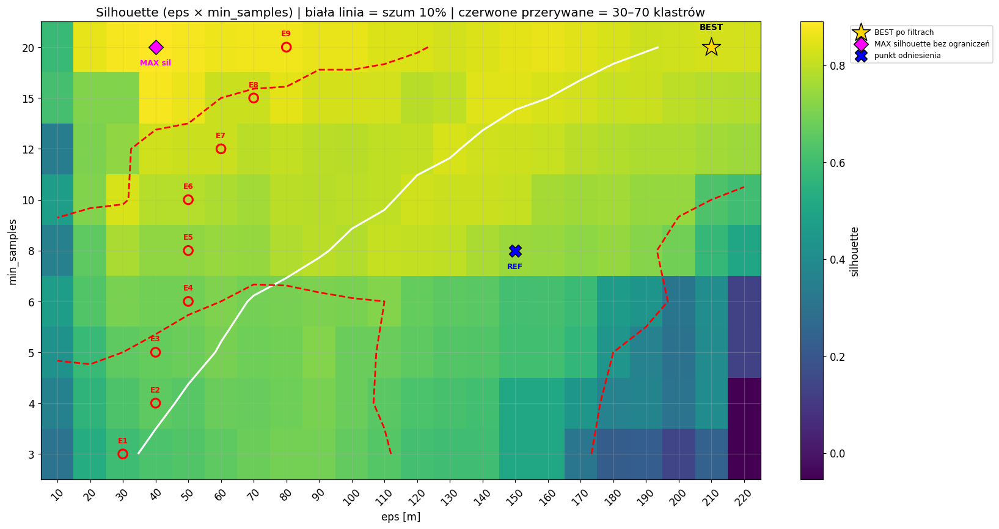

In [18]:
# Heatmapa silhouette + warunki: noise <= 10%, n_clusters 30-70
# + elbow ze szumem + najlepszy wybór po filtrach + max silhouette bez ograniczeń

# -----------------------------
# 1. Najlepszy wynik bez ograniczeń
# -----------------------------

best_sil = (
    grid[grid.silhouette.notna()]
    .sort_values("silhouette", ascending=False)
    .iloc[0]
)

print("MAX silhouette bez ograniczeń:")
print(
    f"eps={best_sil.eps_m:.0f}, "
    f"min_samples={int(best_sil.min_samples)}, "
    f"klastry={int(best_sil.n_clusters)}, "
    f"szum={best_sil.noise*100:.1f}%, "
    f"silhouette={best_sil.silhouette:.3f}"
)

# -----------------------------
# 2. Kandydaci spełniający warunki praktyczne
# -----------------------------

feas = grid[
    (grid.noise <= 0.10) &
    (grid.n_clusters.between(30, 70)) &
    (grid.silhouette.notna())
].copy()

feas = feas.sort_values("silhouette", ascending=False)

if len(feas) == 0:
    raise ValueError("Brak kandydatów spełniających warunki: noise <= 10% oraz 30–70 klastrów.")

best = feas.iloc[0]

print("\nNajlepszy kandydat spełniający warunki:")
print(
    f"eps={best.eps_m:.0f}, "
    f"min_samples={int(best.min_samples)}, "
    f"klastry={int(best.n_clusters)}, "
    f"szum={best.noise*100:.1f}%, "
    f"silhouette={best.silhouette:.3f}"
)

# -----------------------------
# 3. Propozycje zależne od tolerancji na szum
# -----------------------------

base = grid[
    (grid.n_clusters.between(30, 70)) &
    (grid.silhouette.notna())
].copy()

noise_scenarios = [
    ("LOW noise", 0.065),
    ("MID noise", 0.080),
    ("HIGH silhouette", 0.100)
]

choices = []

for label, max_noise in noise_scenarios:
    cand = base[base.noise <= max_noise].copy()

    if len(cand) == 0:
        continue

    best_row = cand.sort_values(
        ["silhouette", "noise"],
        ascending=[False, True]
    ).iloc[0].copy()

    best_row["wariant"] = label
    best_row["max_noise_allowed"] = max_noise

    choices.append(best_row)

choices = pd.DataFrame(choices)

if len(choices) > 0:
    choices = choices.drop_duplicates(
        subset=["eps_m", "min_samples"]
    ).reset_index(drop=True)

    choices["noise_%"] = (choices.noise * 100).round(1)
    choices["silhouette"] = choices.silhouette.round(3)

    print("\nRekomendowane warianty zależnie od tolerancji na szum:")
    display(
        choices[[
            "wariant",
            "eps_m",
            "min_samples",
            "n_clusters",
            "noise_%",
            "silhouette"
        ]]
    )

# -----------------------------
# 4. Pivoty do heatmapy
# -----------------------------

piv_sil = grid.pivot(index="min_samples", columns="eps_m", values="silhouette")
piv_noise = grid.pivot(index="min_samples", columns="eps_m", values="noise")
piv_nc = grid.pivot(index="min_samples", columns="eps_m", values="n_clusters")

epsc = list(piv_sil.columns)
msc = list(piv_sil.index)

# -----------------------------
# 5. Tabela elbow + metryki z gridu
# -----------------------------

fam_check = []

for _, r in fam.iterrows():
    ms = int(r.min_samples)
    eps_elbow_raw = float(r.eps_elbow_m)

    if ms not in msc:
        continue

    # najbliższe eps faktycznie testowane w gridzie
    eps_grid_used = min(epsc, key=lambda x: abs(x - eps_elbow_raw))

    row = grid[
        (grid.eps_m == eps_grid_used) &
        (grid.min_samples == ms)
    ]

    if len(row) == 0:
        continue

    row = row.iloc[0]

    fam_check.append({
        "min_samples": ms,
        "eps_elbow_raw": round(eps_elbow_raw, 1),
        "eps_grid_used": eps_grid_used,
        "n_clusters": int(row.n_clusters),
        "noise_%": round(row.noise * 100, 1),
        "silhouette": round(row.silhouette, 3),
        "spełnia_noise<=10%": row.noise <= 0.10,
        "spełnia_30_70_klastrów": 30 <= row.n_clusters <= 70,
        "spełnia_oba": (row.noise <= 0.10) and (30 <= row.n_clusters <= 70)
    })

fam_check = pd.DataFrame(fam_check)

print("\nElbow dopasowane do najbliższego eps z gridu + metryki DBSCAN:")
display(
    fam_check.sort_values(
        ["min_samples"]
    )
)

# -----------------------------
# 6. Rysowanie heatmapy
# -----------------------------

fig, ax = plt.subplots(figsize=(15, 8))

im = ax.imshow(
    piv_sil.values,
    aspect="auto",
    cmap="viridis",
    origin="lower"
)

ax.set_xticks(range(len(epsc)))
ax.set_xticklabels(epsc, rotation=45)

ax.set_yticks(range(len(msc)))
ax.set_yticklabels(msc)

ax.set_xlabel("eps [m]")
ax.set_ylabel("min_samples")

# Funkcja pomocnicza do położenia punktu na heatmapie
def cell(eps, ms):
    return np.interp(eps, epsc, range(len(epsc))), msc.index(ms)

# Biała linia: noise = 10%
ax.contour(
    np.arange(len(epsc)),
    np.arange(len(msc)),
    piv_noise.values,
    levels=[0.10],
    colors="white",
    linewidths=2
)

# Czerwone przerywane linie: n_clusters = 30 oraz 70
ax.contour(
    np.arange(len(epsc)),
    np.arange(len(msc)),
    piv_nc.values,
    levels=[30, 70],
    colors="red",
    linewidths=1.8,
    linestyles="--"
)

# -----------------------------
# 7. Czerwone koła = elbow, ale bez długich opisów na wykresie
# -----------------------------

for idx, r in fam_check.iterrows():
    ms = int(r.min_samples)
    eps_used = int(r.eps_grid_used)

    xi = epsc.index(eps_used)
    yi = msc.index(ms)

    ax.scatter(
        xi,
        yi,
        marker="o",
        s=90,
        facecolor="none",
        edgecolor="red",
        linewidths=2,
        zorder=7
    )

    # Krótka etykieta: E1, E2, E3...
    ax.text(
        xi,
        yi + 0.22,
        f"E{idx+1}",
        color="red",
        ha="center",
        fontsize=8,
        fontweight="bold",
        zorder=8
    )

# -----------------------------
# 8. Złota gwiazda = najlepszy po filtrach
# -----------------------------

xb, yb = cell(best.eps_m, best.min_samples)

ax.scatter(
    xb,
    yb,
    marker="*",
    s=430,
    color="gold",
    edgecolor="k",
    zorder=9,
    label="BEST po filtrach"
)

ax.text(
    xb,
    yb + 0.35,
    "BEST",
    color="black",
    ha="center",
    fontsize=9,
    fontweight="bold",
    zorder=10
)

# -----------------------------
# 9. Magenta diamond = max silhouette bez ograniczeń
# -----------------------------

xg, yg = cell(best_sil.eps_m, best_sil.min_samples)

ax.scatter(
    xg,
    yg,
    marker="D",
    s=120,
    color="magenta",
    edgecolor="k",
    zorder=10,
    label="MAX silhouette bez ograniczeń"
)

ax.text(
    xg,
    yg - 0.35,
    "MAX sil",
    color="magenta",
    ha="center",
    fontsize=8,
    fontweight="bold",
    zorder=11
)

# -----------------------------
# 10. Punkt odniesienia zespołu
# -----------------------------

old_eps, old_ms = 150, 8

if old_eps in epsc and old_ms in msc:
    xt, yt = cell(old_eps, old_ms)

    ax.scatter(
        xt,
        yt,
        marker="X",
        s=170,
        color="blue",
        edgecolor="k",
        zorder=8,
        label="punkt odniesienia"
    )

    ax.text(
        xt,
        yt - 0.35,
        "REF",
        color="blue",
        ha="center",
        fontsize=8,
        fontweight="bold",
        zorder=9
    )

ax.set_title(
    "Silhouette (eps × min_samples) | "
    "biała linia = szum 10% | "
    "czerwone przerywane = 30–70 klastrów"
)

fig.colorbar(im, ax=ax, fraction=0.046, label="silhouette")

ax.legend(
    loc="upper left",
    bbox_to_anchor=(1.12, 1.0),
    fontsize=8,
    frameon=True
)

fig.tight_layout()
plt.show()



**Czytanie heatmapy:** czerwone kółka („czysty elbow") leżą po stronie **wysokiego szumu** (nad białą linią). Bezpieczny, granularny obszar jest poniżej. Dobry wybór wymaga **podniesienia jednocześnie `eps` i `min_samples`** — wtedy zostajemy w niskim szumie, utrzymujemy liczbę klastrów i poprawiamy silhouette.

## 5. Rekomendacja i porównanie

In [19]:
configs = {
    "punkt odniesienia (150, 8)": (150, 8),
    "LOW noise / rekomendacja ostrożna (140, 10)": (140, 10),
    "MID noise / kompromis (220, 20)": (220, 20),
    "HIGH silhouette / max jakości (210, 20)": (210, 20),
}

out = []

for name, (eps, ms) in configs.items():
    _, nc, noise, sil = run_dbscan(eps, ms)

    out.append({
        "konfiguracja": name,
        "eps_m": eps,
        "min_samples": ms,
        "klastry": nc,
        "szum_%": round(noise * 100, 1),
        "silhouette": round(sil, 3)
    })

pd.DataFrame(out).sort_values(
    ["silhouette", "szum_%"],
    ascending=[False, True]
)

,konfiguracja,eps_m,min_samples,klastry,szum_%,silhouette
3,"HIGH silhouette / max jakości (210, 20)",210,20,32,8.8,0.831
2,"MID noise / kompromis (220, 20)",220,20,33,7.7,0.826
1,"LOW noise / rekomendacja ostrożna (140, 10)",140,10,47,6.4,0.816
0,"punkt odniesienia (150, 8)",150,8,48,2.9,0.747


**Wnioski:**

- **HIGH silhouette / max jakości (210, 20)** — najlepszy wynik silhouette: **0.831**, przy **32 klastrach** i **8.8% szumu**. To wariant najbardziej „jakościowy” według silhouette, ale odrzuca najwięcej punktów jako szum spośród rozważanych rekomendacji.

- **MID noise / kompromis (220, 20)** — podobny silhouette: **0.826**, ale niższy szum: **7.7%** i **33 klastry**. To dobry kompromis, bo traci tylko **0.005** silhouette względem najlepszego wariantu, a zostawia więcej punktów w klastrach.

- **LOW noise / rekomendacja ostrożna (140, 10)** — daje **47 klastrów**, przy wyraźnie lepszym silhouette: **0.816** zamiast **0.747**. Ma najniszy szum **6.4%** o tak wysokim silhouette.

- **punkt odniesienia (150, 8)** — ma najniższy szum spośród wszystkich: **2.9%**, ale też najniższy silhouette: **0.747**. To wybór bardzo zachowawczy: przypisuje więcej punktów do klastrów, ale separacja klastrów jest słabsza.

**Rekomendacja:**  
Jeżeli priorytetem jest zachowanie wyzszej liczby klastrów i niskiego % szumu, najlepsza jest para **(140, 10)**.  
Jeżeli ważniejsza jest jakość separacji klastrów, lepszym kompromisem jest **(220, 20)**, bo daje prawie taki sam silhouette jak maksimum, ale z mniejszym szumem niż wariant **(210, 20)**.

**Lekcja:**  
`eps` i `min_samples` należy dobierać razem. Zwiększenie `min_samples` zaostrza warunek gęstości, więc zwykle wymaga większego `eps`. W przeciwnym razie wiele punktów zostanie uznanych za szum.

## 6. Ile DBSCAN uznaje za szum? 

In [20]:
noise_view = (grid.pivot(index="min_samples",columns="eps_m",values="noise")*100).round(1)
print("% SZUMU dla każdej pary (eps × min_samples):")
display(noise_view)
for eps,ms in [(220,20),(140,10),(40,20),(150,8)]:
    _,_,n,_ = run_dbscan(eps,ms)
    print(f"  eps={eps:3d}, ms={ms:2d}  ->  szum = {n*100:.1f}%")

% SZUMU dla każdej pary (eps × min_samples):


eps_m,10,20,30,40,50,60,70,80,90,100,...,130,140,150,160,170,180,190,200,210,220
min_samples,,,,,,,,,,,,,,,,,,,,,
3,27.5,17.3,11.7,8.1,6.1,4.4,3.1,2.3,1.8,1.4,...,0.5,0.3,0.2,0.2,0.1,0.1,0.1,0.1,0.0,0.0
4,31.4,21.3,16.2,12.0,8.6,6.7,5.0,3.6,2.6,2.1,...,1.0,0.7,0.6,0.5,0.2,0.1,0.1,0.1,0.0,0.0
5,33.8,23.7,19.4,15.4,12.3,9.5,7.3,5.8,4.1,3.0,...,1.4,1.0,0.8,0.6,0.3,0.2,0.1,0.1,0.1,0.1
6,37.2,26.7,21.6,18.1,15.0,11.9,9.6,8.0,6.2,4.4,...,2.3,1.6,1.1,0.9,0.5,0.3,0.2,0.2,0.1,0.1
8,42.2,29.6,24.9,21.6,18.9,16.5,13.5,12.3,10.6,8.6,...,5.3,4.1,2.9,2.6,2.0,1.8,1.5,1.3,0.9,0.4
10,47.5,33.4,27.5,23.7,22.0,19.6,17.7,15.4,13.6,11.8,...,7.3,6.4,5.2,4.3,3.1,2.6,2.1,1.9,1.5,1.2
12,50.6,35.7,28.9,25.1,23.0,21.8,20.0,18.5,16.2,14.5,...,10.6,8.8,6.7,6.0,5.1,4.0,3.5,3.4,2.7,2.0
15,55.0,39.0,32.3,28.4,25.7,23.3,21.5,20.5,18.9,18.2,...,13.0,12.2,11.0,10.0,8.1,6.9,5.6,5.2,4.4,3.7
20,67.8,43.3,36.7,33.1,28.9,27.8,26.6,25.0,22.7,22.1,...,18.3,17.7,16.9,15.1,13.6,11.5,10.4,9.3,8.8,7.7


  eps=220, ms=20  ->  szum = 7.7%
  eps=140, ms=10  ->  szum = 6.4%
  eps= 40, ms=20  ->  szum = 33.1%
  eps=150, ms= 8  ->  szum = 2.9%


**Odpowiedź:** dla rozsądnych par szum to kilka–kilkanaście procent (rekomendacja ~8%, dotychczasowo ~3%). 

## 7. Podział train / test — po co i jak

Dobór `eps` i `min_samples` to **dobieranie hiperparametrów**. Patrząc tylko na cały zbiór (jedna godzina danych), nie mam kontroli, czy wybór nie jest dopasowany do szczegółów tej próbki (overfitting hiperparametrów) — wykryte terminale mogłyby być artefaktem. Odkładam **test (30%)**, parametry „uczę" na train, a na teście sprawdzam, czy szum, silhouette i klastry są podobne. Jeśli tak → wybór się **uogólnia**.

DBSCAN nie ma `predict`, więc punkt testowy przypisuję do klastra **najbliższego core-point** z modelu treningowego (o ile w promieniu `eps`), inaczej szum.

In [21]:
def predict_dbscan(model, Xtr, Xte, eps_m):
    core = model.core_sample_indices_

    if len(core) == 0:
        return np.full(len(Xte), -1)

    tree = BallTree(Xtr[core], metric="haversine")

    dist, nn = tree.query(Xte, k=1)
    dist = dist.ravel() * EARTH_R

    pred = model.labels_[core][nn.ravel()].copy()
    pred[dist > eps_m] = -1

    return pred


def ev(lab, Xs):
    nc = len(set(lab)) - (1 if -1 in lab else 0)
    noise = (lab == -1).mean()
    sil = np.nan

    m = lab != -1

    if nc >= 2 and m.sum() > nc:
        sil = silhouette_score(
            Xs[m],
            lab[m],
            metric="haversine"
        )

    return nc, noise, sil


# Stały split, żeby porównanie było uczciwe
Xtr, Xte = train_test_split(
    X,
    test_size=0.30,
    random_state=42
)

configs = {
    "LOW noise / ostrożna (140,10)": (140, 10),
    "MID noise / kompromis (220,20)": (220, 20),
    "HIGH silhouette / best po filtrach (210,20)": (210, 20),
    "punkt odniesienia zespołu (150,8)": (150, 8),
    "MAX silhouette bez ograniczeń / pułapka (40,20)": (40, 20),
}

res = []

for name, (eps, ms) in configs.items():
    model = DBSCAN(
        eps=eps / EARTH_R,
        min_samples=ms,
        metric="haversine"
    ).fit(Xtr)

    nctr, ntr, sil_tr = ev(model.labels_, Xtr)

    pred = predict_dbscan(model, Xtr, Xte, eps)
    ncte, nte, sil_te = ev(pred, Xte)

    res.append({
        "konfig": name,
        "eps_m": eps,
        "min_samples": ms,
        "klastry_train": nctr,
        "klastry_test": ncte,
        "szum_train_%": round(ntr * 100, 1),
        "szum_test_%": round(nte * 100, 1),
        "sil_train": round(sil_tr, 3) if pd.notna(sil_tr) else np.nan,
        "sil_test": round(sil_te, 3) if pd.notna(sil_te) else np.nan,
        "delta_szum_pp": round((nte - ntr) * 100, 1),
        "delta_sil": round(sil_te - sil_tr, 3) if pd.notna(sil_tr) and pd.notna(sil_te) else np.nan
    })

res_df = pd.DataFrame(res)

res_df.sort_values(
    ["sil_test", "szum_test_%"],
    ascending=[False, True]
)

,konfig,eps_m,min_samples,klastry_train,klastry_test,szum_train_%,szum_test_%,sil_train,sil_test,delta_szum_pp,delta_sil
4,"MAX silhouette bez ograniczeń / pułapka (40,20)",40,20,12,12,37.9,39.6,0.894,0.886,1.7,-0.007
2,"HIGH silhouette / best po filtrach (210,20)",210,20,25,25,16.3,16.9,0.861,0.842,0.6,-0.019
1,"MID noise / kompromis (220,20)",220,20,25,25,15.7,16.5,0.857,0.840,0.8,-0.017
3,"punkt odniesienia zespołu (150,8)",150,8,47,45,6.2,7.9,0.810,0.808,1.7,-0.003
0,"LOW noise / ostrożna (140,10)",140,10,40,40,11.9,12.3,0.820,0.791,0.4,-0.029


Szum i silhouette na **teście** są bliskie **treningowi** → wybór parametrów się uogólnia, klastry nie są artefaktem podziału.

## 8. Mapa porównawcza (interaktywna)

Przełącz warstwy w prawym górnym rogu: czerwone kropki = szum, kolory = ID klastrów (terminali), czarne okręgi = centroidy. Na warstwie „pułapka (40,20)" widać dużo czerwieni i kilka wielkich grup.

In [26]:
import folium
from folium.plugins import GroupedLayerControl

PALETTE = [
    "#1f77b4", "#ff7f0e", "#2ca02c", "#9467bd", "#8c564b",
    "#e377c2", "#17becf", "#bcbd22", "#393b79", "#637939",
    "#8c6d31", "#843c39", "#7b4173", "#3182bd", "#31a354",
    "#756bb1", "#636363", "#e6550d", "#fd8d3c", "#74c476"
]

def col(l):
    return "#d62728" if l == -1 else PALETTE[int(l) % len(PALETTE)]


configs = [
    (220, 20, "KOMPROMIS 220,20"),
    (150, 8, "REFERENCJA 150,8"),
    (40, 20, "MAX SIL / PUŁAPKA 40,20"),
]


m = folium.Map(
    location=[endpoints.lat.mean(), endpoints.lon.mean()],
    zoom_start=12,
    tiles="CartoDB positron"
)

groups = []

for eps, ms, name in configs:
    lab, nc, noise, sil = run_dbscan(eps, ms)

    sil_txt = "NA" if pd.isna(sil) else f"{sil:.3f}"

    fg = folium.FeatureGroup(
        name=(
            f"{name} | "
            f"klastry={nc}, "
            f"szum={noise*100:.1f}%, "
            f"sil={sil_txt}"
        ),
        show=(eps == 220 and ms == 20)
    )

    # Punkty endpointów
    for (lat, lon), l in zip(endpoints[["lat", "lon"]].to_numpy(), lab):
        folium.CircleMarker(
            location=[lat, lon],
            radius=2.5,
            color=col(l),
            fill=True,
            fill_opacity=0.7,
            opacity=0.7,
            tooltip=(
                f"{name}<br>"
                f"label={int(l)}<br>"
                f"{'szum' if l == -1 else 'klaster'}"
            )
        ).add_to(fg)

    # Centroidy klastrów
    dfc = pd.DataFrame({
        "lat": endpoints.lat,
        "lon": endpoints.lon,
        "l": lab
    })

    for l, grp in dfc[dfc.l >= 0].groupby("l"):
        folium.CircleMarker(
            location=[grp.lat.mean(), grp.lon.mean()],
            radius=4 + np.log1p(len(grp)),
            color="black",
            weight=2,
            fill=False,
            tooltip=(
                f"{name}<br>"
                f"klaster {int(l)}<br>"
                f"{len(grp)} endpointów"
            )
        ).add_to(fg)

    fg.add_to(m)
    groups.append(fg)


GroupedLayerControl(
    groups={"Konfiguracja DBSCAN": groups},
    collapsed=False,
    exclusive_groups=True
).add_to(m)

m.save("dbscan_porownanie_map.html")
m

## 9. Podsumowanie

- DBSCAN grupuje endpointy (origin+destination) w terminale macierzy OD; parametry zespołu (`150 m`, `8`) są hard-coded, bez metody doboru.
- `eps` i `min_samples` są **sprzężone** — każdy `min_samples` ma własny elbow `eps`; czysty elbow wpada w wysoki szum (np. 33%).
- Sam max silhouette myli (≈16 klastrów, 33% szumu). Wybór robię **wielokryterialnie**: szum ≤ 10% + 30–70 klastrów + wysoki silhouette.
- **Rekomendacja: `eps=220 m`, `min_samples=20`** — ~33 klastry, szum ~8%, silhouette ~0.83 (lepiej niż wcześniej przy podobnej i niskim szumie).
- Train/test potwierdza uogólnianie. Pytanie o szum: dla sensownych par to kilka–kilkanaście %.